# Exploring Stack Overflow's 2020 Developer Survey Results

# Table of Contents
* [Introduction](#intro)
* [Initial Data Exploration](#exploration)
* [Exploratory Data Analysis](#eda)
    * [Research Question 1](#q1)
    * [Research Question 2](#q2)
    * [Research Question 3](#q3)
    * [Research Question 4](#q4)
* [Conclusions](#conclusions)
* [Source Index](#sources)

<a id='intro'></a>
# Introduction

**Overview**
>This project focuses on using the CRISP-DM process to develop and answer a series of questions based on Stack Overflow's annual Developer Survey results.

**Stack Overflow's Developer Survey**
>Stack Overflow's annual Developer Survey is the most compehensive and largest survey reaching coders worldwide. The 2020 Developer Survey was used in this analysis. This survey includes responses from nearly 65,000 developers and was conducted in February 2020 before the COVID-19 pandemic. 

**Datasets**
> The data for the 2020 Developer Survey was retrieved from the [Stack Overflow website](https://insights.stackoverflow.com/survey/2020). The survey results, a schema, and the survey are included in the downloaded files. 

<a id='exploration'></a>
# Initial Data Exploration

**Gathering datasets and setting up workspace**

In [206]:
# Set up workspace
import numpy as np
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [201]:
# Import Stackoverflow survey data as dataframe
df_2020 = pd.read_csv('2020_survey_results_public.csv')

# Import schema
df_schema_2020 = pd.read_csv('2020_survey_results_schema.csv')

**Assessing dataframes**

In [4]:
# Display first few rows of 2020 df to get an idea of survey q's and responses
df_2020.head()

,Respondent,MainBranch,Hobbyist,Age,Age1stCode,CompFreq,CompTotal,ConvertedComp,Country,CurrencyDesc,...,SurveyEase,SurveyLength,Trans,UndergradMajor,WebframeDesireNextYear,WebframeWorkedWith,WelcomeChange,WorkWeekHrs,YearsCode,YearsCodePro
0,1,I am a developer by profession,Yes,NaN,13,Monthly,NaN,NaN,Germany,European Euro,...,Neither easy nor difficult,Appropriate in length,No,"Computer science, computer engineering, or sof...",ASP.NET Core,ASP.NET;ASP.NET Core,Just as welcome now as I felt last year,50.0,36,27
1,2,I am a developer by profession,No,NaN,19,NaN,NaN,NaN,United Kingdom,Pound sterling,...,NaN,NaN,NaN,"Computer science, computer engineering, or sof...",NaN,NaN,Somewhat more welcome now than last year,NaN,7,4
2,3,I code primarily as a hobby,Yes,NaN,15,NaN,NaN,NaN,Russian Federation,NaN,...,Neither easy nor difficult,Appropriate in length,NaN,NaN,NaN,NaN,Somewhat more welcome now than last year,NaN,4,NaN
3,4,I am a developer by profession,Yes,25.0,18,NaN,NaN,NaN,Albania,Albanian lek,...,NaN,NaN,No,"Computer science, computer engineering, or sof...",NaN,NaN,Somewhat less welcome now than last year,40.0,7,4
4,5,"I used to be a developer by profession, but no...",Yes,31.0,16,NaN,NaN,NaN,United States,NaN,...,Easy,Too short,No,"Computer science, computer engineering, or sof...",Django;Ruby on Rails,Ruby on Rails,Just as welcome now as I felt last year,NaN,15,8


In [6]:
# Display df_2020 to see variables/info
df_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64461 entries, 0 to 64460
Data columns (total 61 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Respondent                    64461 non-null  int64  
 1   MainBranch                    64162 non-null  object 
 2   Hobbyist                      64416 non-null  object 
 3   Age                           45446 non-null  float64
 4   Age1stCode                    57900 non-null  object 
 5   CompFreq                      40069 non-null  object 
 6   CompTotal                     34826 non-null  float64
 7   ConvertedComp                 34756 non-null  float64
 8   Country                       64072 non-null  object 
 9   CurrencyDesc                  45472 non-null  object 
 10  CurrencySymbol                45472 non-null  object 
 11  DatabaseDesireNextYear        44070 non-null  object 
 12  DatabaseWorkedWith            49537 non-null  object 
 13  D

In [8]:
# Looking at schema for 2020 survey
df_schema_2020.head()

,Column,QuestionText
0,Respondent,Randomized respondent ID number (not in order ...
1,MainBranch,Which of the following options best describes ...
2,Hobbyist,Do you code as a hobby?
3,Age,What is your age (in years)? If you prefer not...
4,Age1stCode,At what age did you write your first line of c...


In [9]:
# Set to display all columns and rows for assessment prior to cleaning
pd.options.display.max_columns = None
pd.options.display.max_rows = None

**Cleaning datasets**

In [10]:
df_2019.sample(5)

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase
69304,69746,"I am not primarily a developer, but I write co...",Yes,Less than once a month but more than once per ...,"OSS is, on average, of HIGHER quality than pro...",Employed full-time,Brazil,No,"Other doctoral degree (Ph.D, Ed.D., etc.)","Computer science, computer engineering, or sof...",Taken an online course in programming or softw...,"1,000 to 4,999 employees",Data scientist or machine learning specialist,10,13,6,Very satisfied,Very satisfied,Very confident,Yes,Not sure,"I’m not actively looking, but I am open to new...",3-4 years ago,Write any code;Complete a take-home project;In...,Yes,Office environment or company culture;How wide...,I heard about a job opportunity (from a recrui...,BRL,Brazilian real,325000.0,Yearly,88787.0,40.0,There is a schedule and/or spec (made by me or...,Distracting work environment;Lack of support f...,A few days each month,Office,A little above average,"Yes, because I was told to do so",5.0,"Yes, it's part of our process",Developers typically have the most influence o...,I have some influence,Bash/Shell/PowerShell;C;C++;HTML/CSS;Java;Pyth...,Clojure;Python;Scala;SQL,Elasticsearch;MongoDB;MySQL;PostgreSQL,MySQL;PostgreSQL,AWS,AWS;Docker;Google Cloud Platform,Flask,NaN,Apache Spark;Pandas;TensorFlow,Apache Spark;Pandas;TensorFlow;Torch/PyTorch,IntelliJ;IPython / Jupyter;Sublime Text;Vim,MacOS,"Development;Production;Outside of work, for pe...",Not at all,NaN,Yes,Yes,Yes,WhatsApp,In real life (in person),Login,2011,A few times per week,Find answers to specific questions;Learn how t...,1-2 times per week,Stack Overflow was much faster,60+ minutes,Yes,Less than once per month or monthly,"No, I didn't know that Stack Overflow had a jo...","No, I've heard of them, but I am not part of a...","No, not really",Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,30.0,Man,No,Straight / Heterosexual,Black or of African descent;Biracial,No,Appropriate in length,Neither easy nor difficult
17771,17869,I am a developer by profession,Yes,Less than once a month but more than once per ...,"OSS is, on average, of HIGHER quality than pro...",Employed full-time,United Kingdom,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)","Computer science, computer engineering, or sof...",Taken an online course in programming or softw...,10 to 19 employees,"Developer, back-end;Developer, front-end;Devel...",10,14,3,Very satisfied,Very satisfied,Very confident,Not sure,Not sure,I am not interested in new job opportunities,Less than a year ago,Complete a take-home project;Interview with pe...,No,Financial performance or funding status of the...,I heard about a job opportunity (from a recrui...,GBP,Pound sterling,60500.0,Yearly,79163.0,45.0,There is a schedule and/or spec (made by me or...,Distracting work environment;Not enough people...,A few days each month,Office,A little above average,"Yes, because I see value in code review",5.0,"Yes, it's part of our process",Developers typically have the most influence o...,I have som

* NaN in 'UndergradMajor', 'LastInt', 'ResumeUpdate', 'CompTotal', 'CompFreq', 'ConvertedComp', 'CodeRevHrs', 'PurchaseHow', 'LanguagDesireNextYear', 'DatabaseDesireNextYear', 'PlatformDesireNextYear', 'WebFrameWorkedWith', 'MiscTechWorkedWith', 'BlockchainOrg', 'BlockChainls', 'ScreenName', 'SOTimeSaved', 'SOHowMuchTime', 'SoNewContent', 'Sexuality', 'Dependents' columns 
* Entry "What?" in 'OffOn' column
* Data entry by has consistent format (i.e. 'Yes', 'No' answers, whole numbers, separation by ';' in language columns like 'LanguagWorkedWith' etc), responses are responses i.e. columns 'Blockchainls'

In [11]:
df_2020.sample(5)

,Respondent,MainBranch,Hobbyist,Age,Age1stCode,CompFreq,CompTotal,ConvertedComp,Country,CurrencyDesc,CurrencySymbol,DatabaseDesireNextYear,DatabaseWorkedWith,DevType,EdLevel,Employment,Ethnicity,Gender,JobFactors,JobSat,JobSeek,LanguageDesireNextYear,LanguageWorkedWith,MiscTechDesireNextYear,MiscTechWorkedWith,NEWCollabToolsDesireNextYear,NEWCollabToolsWorkedWith,NEWDevOps,NEWDevOpsImpt,NEWEdImpt,NEWJobHunt,NEWJobHuntResearch,NEWLearn,NEWOffTopic,NEWOnboardGood,NEWOtherComms,NEWOvertime,NEWPurchaseResearch,NEWPurpleLink,NEWSOSites,NEWStuck,OpSys,OrgSize,PlatformDesireNextYear,PlatformWorkedWith,PurchaseWhat,Sexuality,SOAccount,SOComm,SOPartFreq,SOVisitFreq,SurveyEase,SurveyLength,Trans,UndergradMajor,WebframeDesireNextYear,WebframeWorkedWith,WelcomeChange,WorkWeekHrs,YearsCode,YearsCodePro
21494,21579,I am a developer by profession,Yes,37.0,8,Monthly,NaN,NaN,Sweden,Swedish krona,SEK,NaN,NaN,"Developer, front-end;Developer, mobile","Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Employed full-time,White or of European descent,Man,"Languages, frameworks, and other technologies ...",Slightly satisfied,"I’m not actively looking, but I am open to new...",Swift,Kotlin;Swift,NaN,NaN,Jira;Gitlab;Slack;Trello,Confluence;Jira;Github;Gitlab;Slack;Trello,Not sure,Somewhat important,Fairly important,Having a bad day (or week or month) at work;Cu...,"Read company media, such as employee blogs or ...",Every few months,No,Onboarding? What onboarding?,Yes,Occasionally: 1-2 days per quarter but less th...,Start a free trial;Ask developers I know/work ...,"Hello, old friend",Stack Overflow (public Q&A for anyone who codes),Call a coworker or friend;Visit Stack Overflow...,MacOS,100 to 499 employees,iOS,Android;iOS,I have a great deal of influence,Straight / Heterosexual,No,"No, not really",NaN,A few times per week,Easy,Appropriate in length,No,"Computer science, computer engineering, or sof...",NaN,NaN,Just as welcome now as I felt last year,NaN,25,15
61709,62967,I am a student who is learning to code,No,NaN,NaN,NaN,NaN,NaN,India,NaN,NaN,MySQL;Oracle,MySQL,NaN,NaN,Student,NaN,NaN,NaN,NaN,NaN,HTML/CSS;Java;JavaScript,C;C++,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Android;iOS;Linux;Windows,Android;Linux;Windows,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61773,63038,I am a developer by profession,Yes,NaN,NaN,NaN,NaN,NaN,Ukraine,NaN,NaN,MongoDB;MySQL;PostgreSQL,MySQL,NaN,NaN,Employed part-time,NaN,NaN,NaN,NaN,NaN,Java;JavaScript;Python,C++;Java,Node.js,Unreal Engine,Github,Github,NaN,NaN,NaN,NaN,NaN,Every few months,NaN,NaN,Yes,NaN,NaN,"Hello, old friend",Stack Overflow (public Q&A for anyone who codes),Visit Stack Overflow;Watch help / tutorial vid...,Windows,NaN,Linux;Windows,Linux;Windows,I have little or no influence,NaN,No,Neutral,NaN,A few times per week,NaN,NaN,NaN,NaN,Angular.js;React.js;Spring,Spring,NaN,NaN,NaN,NaN
16430,16487,I am a developer by profession,Yes,27.0,16,Monthly,5600000.0,18336.0,Uganda,Ugandan shilling,UGX,Cassandra;Couchbase;DynamoDB;MariaDB,Elasticsearch;Firebase;PostgreSQL;Redis;SQLite,"Developer, back-end","Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Employed full-time,Black or of African descent,Man,Diversity of the company or organization;Langu...,Slightly dissatisfied,I am actively looking for a job,Go;Python;Ruby;Rust;Scala,Go;Python;TypeScript,Node.js,NaN,Jira;Github;Slack;Microsoft Azure;Google Suite...,"Jira;Github;Slack;Google Suite (Docs, Meet, etc)",Yes,Extremely important,Somewhat important,Better compensation;Wanting to work with new t...,"Read company media, such as employee blogs or ...",Once a year,Yes,Yes,Yes,Rarely: 1-2 days per year or less,NaN,Amused,Stack Overflow (public Q&A for anyone who code...,Call a coworker or friend;Visit Stack Overflow,MacOS,"1,000 to 4,999 employees",AWS;Docker;Google Cloud Platform;Heroku;Kubern...,AWS;Docker;Heroku;Kubernetes;MacOS,I have little or no influence,Straight / Heterosexual,Yes,"Yes, somewhat",Less th

* Lots of 'NaN' entries in columns: 'UndergradMajor', 'LastInt', 'ResumeUpdate', 'CompTotal', 'CompFreq', 'ConvertedComp', 'CodeRevHrs', 'PurchaseHow', 'LanguagDesireNextYear', 'DatabaseDesireNextYear', 'PlatformDesireNextYear', 'WebFrameWorkedWith', 'MiscTechWorkedWith', 'BlockchainOrg', 'BlockChainls', 'ScreenName', 'SOTimeSaved', 'SOHowMuchTime', 'SoNewContent', 'Sexuality', 'Dependents' columns 
* Columns with 'NEW' before the name, are questions added to the 2020 survey (i.e. these questions were not asked in previous surveys) 

The dataset is overall pretty clean. There are missing entries throughout the df denoted as 'NaN.' Missing entries and d types will be assessed and modified as needed based on questions in exploratory data analysis section.

<a id='eda'></a>
# Exploratory Data Analysis

**Gathering data to find related fields**

In [12]:
df_2020.head()

,Respondent,MainBranch,Hobbyist,Age,Age1stCode,CompFreq,CompTotal,ConvertedComp,Country,CurrencyDesc,CurrencySymbol,DatabaseDesireNextYear,DatabaseWorkedWith,DevType,EdLevel,Employment,Ethnicity,Gender,JobFactors,JobSat,JobSeek,LanguageDesireNextYear,LanguageWorkedWith,MiscTechDesireNextYear,MiscTechWorkedWith,NEWCollabToolsDesireNextYear,NEWCollabToolsWorkedWith,NEWDevOps,NEWDevOpsImpt,NEWEdImpt,NEWJobHunt,NEWJobHuntResearch,NEWLearn,NEWOffTopic,NEWOnboardGood,NEWOtherComms,NEWOvertime,NEWPurchaseResearch,NEWPurpleLink,NEWSOSites,NEWStuck,OpSys,OrgSize,PlatformDesireNextYear,PlatformWorkedWith,PurchaseWhat,Sexuality,SOAccount,SOComm,SOPartFreq,SOVisitFreq,SurveyEase,SurveyLength,Trans,UndergradMajor,WebframeDesireNextYear,WebframeWorkedWith,WelcomeChange,WorkWeekHrs,YearsCode,YearsCodePro
0,1,I am a developer by profession,Yes,NaN,13,Monthly,NaN,NaN,Germany,European Euro,EUR,Microsoft SQL Server,Elasticsearch;Microsoft SQL Server;Oracle,"Developer, desktop or enterprise applications;...","Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Independent contractor, freelancer, or self-em...",White or of European descent,Man,"Languages, frameworks, and other technologies ...",Slightly satisfied,I am not interested in new job opportunities,C#;HTML/CSS;JavaScript,C#;HTML/CSS;JavaScript,.NET Core;Xamarin,.NET;.NET Core,Microsoft Teams;Microsoft Azure;Trello,Confluence;Jira;Slack;Microsoft Azure;Trello,No,Somewhat important,Fairly important,NaN,NaN,Once a year,Not sure,NaN,No,Often: 1-2 days per week or more,Start a free trial;Ask developers I know/work ...,Amused,Stack Overflow (public Q&A for anyone who codes),Visit Stack Overflow;Go for a walk or other ph...,Windows,2 to 9 employees,Android;iOS;Kubernetes;Microsoft Azure;Windows,Windows,NaN,Straight / Heterosexual,No,"No, not at all",NaN,Multiple times per day,Neither easy nor difficult,Appropriate in length,No,"Computer science, computer engineering, or sof...",ASP.NET Core,ASP.NET;ASP.NET Core,Just as welcome now as I felt last year,50.0,36,27
1,2,I am a developer by profession,No,NaN,19,NaN,NaN,NaN,United Kingdom,Pound sterling,GBP,NaN,NaN,"Developer, full-stack;Developer, mobile","Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Employed full-time,NaN,NaN,NaN,Very dissatisfied,I am not interested in new job opportunities,Python;Swift,JavaScript;Swift,React Native;TensorFlow;Unity 3D,React Native,Github;Slack,Confluence;Jira;Github;Gitlab;Slack,NaN,NaN,Fairly important,NaN,NaN,Once a year,Not sure,NaN,No,NaN,NaN,Amused,Stack Overflow (public Q&A for anyone who code...,Visit Stack Overflow;Go for a walk or other ph...,MacOS,"1,000 to 4,999 employees",iOS;Kubernetes;Linux;MacOS,iOS,I have little or no influence,NaN,Yes,"Yes, definitely",Less than once per month or monthly,Multiple times per day,NaN,NaN,NaN,"Computer science, computer engineering, or sof...",NaN,NaN,Somewhat more welcome now than last year,NaN,7,4
2,3,I code primarily as a hobby,Yes,NaN,15,NaN,NaN,NaN,Russian Federation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Objective-C;Python;Swift,Objective-C;Python;Swift,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Once a decade,NaN,NaN,No,NaN,NaN,NaN,Stack Overflow (public Q&A for anyone who codes),NaN,Linux-based,NaN,NaN,NaN,NaN,NaN,Yes,"Yes, somewhat",A few times per month or weekly,Daily or almost daily,Neither easy nor difficult,Appropriate in length,NaN,NaN,NaN,NaN,Somewhat more welcome now than last year,NaN,4,NaN
3,4,I am a developer by profession,Yes,25.0,18,NaN,NaN,NaN,Albania,Albanian lek,ALL,NaN,NaN,NaN,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",NaN,White or of European descent,Man,Flex time or a flexible schedule;Office enviro...,Slightly dissatisfied,"I’m not actively looking, but I am open to new...",NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,Not at all important/not necessary,Curious about other opportunities;Wanting to w...,NaN,Once a year,Not sure,Yes,Yes,Occasionally: 1-2 days per quarter but less th...,NaN,NaN,Stack Overflow (public Q&A for anyone who code...,NaN,Lin

In [13]:
df_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64461 entries, 0 to 64460
Data columns (total 61 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Respondent                    64461 non-null  int64  
 1   MainBranch                    64162 non-null  object 
 2   Hobbyist                      64416 non-null  object 
 3   Age                           45446 non-null  float64
 4   Age1stCode                    57900 non-null  object 
 5   CompFreq                      40069 non-null  object 
 6   CompTotal                     34826 non-null  float64
 7   ConvertedComp                 34756 non-null  float64
 8   Country                       64072 non-null  object 
 9   CurrencyDesc                  45472 non-null  object 
 10  CurrencySymbol                45472 non-null  object 
 11  DatabaseDesireNextYear        44070 non-null  object 
 12  DatabaseWorkedWith            49537 non-null  object 
 13  D

In [14]:
df_schema_2020

,Column,QuestionText
0,Respondent,Randomized respondent ID number (not in order ...
1,MainBranch,Which of the following options best describes ...
2,Hobbyist,Do you code as a hobby?
3,Age,What is your age (in years)? If you prefer not...
4,Age1stCode,At what age did you write your first line of c...
5,CompFreq,"Is that compensation weekly, monthly, or yearly?"
6,CompTotal,What is your current total compensation (salar...
7,ConvertedComp,Salary converted to annual USD salaries using ...
8,Country,Where do you live?
9,CurrencyDesc,Which currency do you use day-to-day? If your ...


**Exploring survey responses and d types to help develop questions**

In [15]:
ed_status = df_2020.EdLevel.value_counts()
ed_status

Bachelor’s degree (B.A., B.S., B.Eng., etc.)                                          26542
Master’s degree (M.A., M.S., M.Eng., MBA, etc.)                                       13112
Some college/university study without earning a degree                                 7239
Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)     4771
Associate degree (A.A., A.S., etc.)                                                    1843
Other doctoral degree (Ph.D., Ed.D., etc.)                                             1690
Primary/elementary school                                                               941
Professional degree (JD, MD, etc.)                                                      800
I never completed any formal education                                                  493
Name: EdLevel, dtype: int64

In [16]:
ed_importance = df_2020.NEWEdImpt.value_counts()
ed_importance

Fairly important                      12674
Very important                        11866
Somewhat important                    11388
Not at all important/not necessary     7785
Critically important                   4752
Name: NEWEdImpt, dtype: int64

In [209]:
job_hunt = df_2020.NEWJobHunt.value_counts().nlargest(10)
job_hunt

Curious about other opportunities;Better compensation;Wanting to work with new technologies;Growth or leadership opportunities                                                 1127
Curious about other opportunities;Better compensation;Better work/life balance;Wanting to work with new technologies;Growth or leadership opportunities                        1121
Better compensation                                                                                                                                                             803
Curious about other opportunities;Better compensation;Wanting to work with new technologies                                                                                     717
Better compensation;Better work/life balance;Wanting to work with new technologies;Growth or leadership opportunities                                                           662
Curious about other opportunities;Better compensation;Better work/life balance;Wanting to work with 

In [210]:
job_hunt_res = df_2020.NEWJobHuntResearch.value_counts().nlargest(10)
job_hunt_res

Read company media, such as employee blogs or company culture videos;Company reviews from third party sites (e.g. Glassdoor, Blind);Publicly available financial information (e.g. Crunchbase);Personal network - friends or family;Read other media like news articles, founder profiles, etc. about the company;Directly asking current or past employees at the company    2456
Read company media, such as employee blogs or company culture videos;Company reviews from third party sites (e.g. Glassdoor, Blind);Personal network - friends or family                                                                                                                                                                                                      2404
Read company media, such as employee blogs or company culture videos;Company reviews from third party sites (e.g. Glassdoor, Blind)                                                                                                                               

In [19]:
other_comms = df_2020.NEWOtherComms.value_counts()
other_comms

No     33367
Yes    23838
Name: NEWOtherComms, dtype: int64

In [211]:
SO_sites = df_2020.NEWSOSites.value_counts().nlargest(10)
SO_sites

Stack Overflow (public Q&A for anyone who codes);Stack Exchange (public Q&A for a variety of topics)                                                                                                                                                                                                                 22415
Stack Overflow (public Q&A for anyone who codes);Stack Exchange (public Q&A for a variety of topics);Stack Overflow Jobs (for job seekers)                                                                                                                                                                           13891
Stack Overflow (public Q&A for anyone who codes)                                                                                                                                                                                                                                                                     12762
Stack Overflow (public Q&A for anyone who codes);Stack 

In [212]:
stuck = df_2020.NEWStuck.value_counts().nlargest(10)
stuck

Visit Stack Overflow                                                                                                                                      2904
Visit Stack Overflow;Watch help / tutorial videos                                                                                                         2862
Call a coworker or friend;Visit Stack Overflow;Watch help / tutorial videos                                                                               2833
Call a coworker or friend;Visit Stack Overflow;Do other work and come back later                                                                          2343
Call a coworker or friend;Visit Stack Overflow                                                                                                            2205
Call a coworker or friend;Visit Stack Overflow;Go for a walk or other physical activity;Watch help / tutorial videos;Do other work and come back later    2168
Call a coworker or friend;Visit Stack Overflow

In [22]:
SO_account = df_2020.SOAccount.value_counts()
SO_account

Yes                        47275
No                          6101
Not sure/can't remember     3429
Name: SOAccount, dtype: int64

In [213]:
comp = df_2020.ConvertedComp.value_counts().nlargest(10)
comp

120000.0     341
100000.0     306
150000.0     277
2000000.0    258
1000000.0    258
64859.0      258
110000.0     244
130000.0     211
90000.0      208
54049.0      204
Name: ConvertedComp, dtype: int64

In [24]:
employment = df_2020.Employment.value_counts()
employment

Employed full-time                                      45270
Student                                                  7787
Independent contractor, freelancer, or self-employed     5672
Not employed, but looking for work                       2343
Employed part-time                                       2217
Not employed, and not looking for work                    322
Retired                                                   243
Name: Employment, dtype: int64

In [214]:
job_factors = df_2020.JobFactors.value_counts().nlargest(10)
job_factors

Flex time or a flexible schedule;Languages, frameworks, and other technologies I’d be working with;Remote work options                                               2777
Languages, frameworks, and other technologies I’d be working with;Office environment or company culture;Opportunities for professional development                   2570
Flex time or a flexible schedule;Languages, frameworks, and other technologies I’d be working with;Office environment or company culture                             2508
Flex time or a flexible schedule;Languages, frameworks, and other technologies I’d be working with;Opportunities for professional development                        1666
Flex time or a flexible schedule;Office environment or company culture;Opportunities for professional development                                                    1650
Flex time or a flexible schedule;Remote work options;Office environment or company culture                                                            

In [26]:
job_sat = df_2020.JobSat.value_counts()
job_sat

Very satisfied                        14611
Slightly satisfied                    13930
Slightly dissatisfied                  7124
Neither satisfied nor dissatisfied     5783
Very dissatisfied                      3746
Name: JobSat, dtype: int64

In [27]:
job_seek = df_2020.JobSeek.value_counts()
job_seek

I’m not actively looking, but I am open to new opportunities    29776
I am not interested in new job opportunities                    13001
I am actively looking for a job                                  8950
Name: JobSeek, dtype: int64

**Based on the assessment of these datasets, the following topics will be explored:**
1. What are the most and least popular programming languages?
2. According to developers, how important is background education in their job market?
3. What factors lead developers to look for other jobs?
4. What resources do developers use when learning about companies during their job search?

<a id='q1'></a>
## 1. What are the most and least popular programming languages?

**Gathering and assessing datasets**

In [160]:
df_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64461 entries, 0 to 64460
Data columns (total 61 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Respondent                    64461 non-null  int64  
 1   MainBranch                    64162 non-null  object 
 2   Hobbyist                      64416 non-null  object 
 3   Age                           45446 non-null  float64
 4   Age1stCode                    57900 non-null  object 
 5   CompFreq                      40069 non-null  object 
 6   CompTotal                     34826 non-null  float64
 7   ConvertedComp                 34756 non-null  float64
 8   Country                       64072 non-null  object 
 9   CurrencyDesc                  45472 non-null  object 
 10  CurrencySymbol                45472 non-null  object 
 11  DatabaseDesireNextYear        44070 non-null  object 
 12  DatabaseWorkedWith            49537 non-null  object 
 13  D

In [161]:
df_schema_2020

,Column,QuestionText
0,Respondent,Randomized respondent ID number (not in order ...
1,MainBranch,Which of the following options best describes ...
2,Hobbyist,Do you code as a hobby?
3,Age,What is your age (in years)? If you prefer not...
4,Age1stCode,At what age did you write your first line of c...
5,CompFreq,"Is that compensation weekly, monthly, or yearly?"
6,CompTotal,What is your current total compensation (salar...
7,ConvertedComp,Salary converted to annual USD salaries using ...
8,Country,Where do you live?
9,CurrencyDesc,Which currency do you use day-to-day? If your ...


**Cleaning**

In [28]:
# Group by employment (full-time), years coding, language, and type of developer
q1 = df_2020[['Employment', 'YearsCode', 'LanguageWorkedWith', 'DevType']]

q1 = q1[q1.Employment == "Employed full-time"]
q1.head()

,Employment,YearsCode,LanguageWorkedWith,DevType
1,Employed full-time,7,JavaScript;Swift,"Developer, full-stack;Developer, mobile"
4,Employed full-time,15,HTML/CSS;Ruby;SQL,NaN
5,Employed full-time,6,HTML/CSS;Java;JavaScript,"Designer;Developer, front-end;Developer, mobile"
6,Employed full-time,6,C#;HTML/CSS;PHP,"Developer, back-end;Developer, front-end;Devel..."
7,Employed full-time,17,Python;SQL,"Developer, back-end;Developer, desktop or ente..."


In [29]:
q1['LanguageWorkedWith'].isnull()

1        False
4        False
5        False
6        False
7        False
9        False
10       False
11       False
12       False
13       False
16       False
17       False
18       False
19       False
21       False
22       False
23       False
24       False
25       False
26       False
29       False
30       False
31       False
32       False
35       False
36       False
37       False
40       False
41       False
42       False
43       False
44       False
45       False
46       False
47       False
48       False
50       False
51       False
53       False
55       False
56       False
58       False
60       False
63       False
64       False
66       False
68       False
69       False
70       False
72       False
74       False
76       False
78       False
79       False
81       False
82       False
83       False
86       False
88       False
89       False
90       False
91       False
92       False
93       False
95       False
96       False
97       F

In [220]:
# Split column by ; to display languages as a series
def split_lang(df, column):
    ''' Split column by ;,
        returns a splited series.
    '''
    
    df_copy = df
    column_series = df_copy[column].apply(lambda x: x.split(';'))
    
    return column_series

# Fill NaN entries with 'missing'
q1['LanguageWorkedWith'] = q1['LanguageWorkedWith'].fillna('missing')
split_list_lang = split_lang(q1, 'LanguageWorkedWith')
split_list_lang

1                                      [JavaScript, Swift]
4                                    [HTML/CSS, Ruby, SQL]
5                             [HTML/CSS, Java, JavaScript]
6                                      [C#, HTML/CSS, PHP]
7                                            [Python, SQL]
9                [HTML/CSS, Java, JavaScript, Python, SQL]
10                                 [C#, JavaScript, Swift]
11                                  [HTML/CSS, JavaScript]
12                                 [C, JavaScript, Python]
13                 [HTML/CSS, JavaScript, SQL, TypeScript]
16            [C#, HTML/CSS, JavaScript, Python, SQL, VBA]
17                 [Bash/Shell/PowerShell, HTML/CSS, Perl]
18       [Bash/Shell/PowerShell, C#, HTML/CSS, JavaScri...
19                                 [Java, JavaScript, SQL]
21                                          [Java, Python]
22                        [Bash/Shell/PowerShell, C#, C++]
23         [Bash/Shell/PowerShell, Java, Kotlin, PHP, SQ

In [219]:
# Flat nested list by language
def disarray_lang(array_list):
    ''' Flat a nested list,
        returns a flat list.
    '''
    
    objects = []
    
    for row in array_list:
        for obj in row:
            objects.append(obj.strip())
            
    return objects

# Flat nested list objects
list_worked_languages = disarray_lang(split_list_lang)
list_worked_languages

['JavaScript',
 'Swift',
 'HTML/CSS',
 'Ruby',
 'SQL',
 'HTML/CSS',
 'Java',
 'JavaScript',
 'C#',
 'HTML/CSS',
 'PHP',
 'Python',
 'SQL',
 'HTML/CSS',
 'Java',
 'JavaScript',
 'Python',
 'SQL',
 'C#',
 'JavaScript',
 'Swift',
 'HTML/CSS',
 'JavaScript',
 'C',
 'JavaScript',
 'Python',
 'HTML/CSS',
 'JavaScript',
 'SQL',
 'TypeScript',
 'C#',
 'HTML/CSS',
 'JavaScript',
 'Python',
 'SQL',
 'VBA',
 'Bash/Shell/PowerShell',
 'HTML/CSS',
 'Perl',
 'Bash/Shell/PowerShell',
 'C#',
 'HTML/CSS',
 'JavaScript',
 'SQL',
 'TypeScript',
 'Java',
 'JavaScript',
 'SQL',
 'Java',
 'Python',
 'Bash/Shell/PowerShell',
 'C#',
 'C++',
 'Bash/Shell/PowerShell',
 'Java',
 'Kotlin',
 'PHP',
 'SQL',
 'Bash/Shell/PowerShell',
 'C',
 'JavaScript',
 'Python',
 'Bash/Shell/PowerShell',
 'C',
 'C++',
 'Java',
 'Python',
 'SQL',
 'Bash/Shell/PowerShell',
 'C#',
 'HTML/CSS',
 'JavaScript',
 'Python',
 'SQL',
 'TypeScript',
 'C',
 'C++',
 'C',
 'C++',
 'Java',
 'Python',
 'SQL',
 'VBA',
 'HTML/CSS',
 'JavaScript',


In [221]:
# Make a dict that groups by count and returns a dict
def group_list_lang(data_list):
    ''' Group by count to a list,
        returns a result dict.
    '''
    
    grouped_list = dict(Counter(data_list))
    grouped_dict = [{'Programming Language':key, 'Count': value} for key, value in grouped_list.items()]
    
    return grouped_dict

    
# Group list and dict
dict_worked_languages = group_list_lang(list_worked_languages)
dict_worked_languages

[{'Programming Language': 'JavaScript', 'Count': 27883},
 {'Programming Language': 'Swift', 'Count': 2339},
 {'Programming Language': 'HTML/CSS', 'Count': 24755},
 {'Programming Language': 'Ruby', 'Count': 2996},
 {'Programming Language': 'SQL', 'Count': 22910},
 {'Programming Language': 'Java', 'Count': 15461},
 {'Programming Language': 'C#', 'Count': 13243},
 {'Programming Language': 'PHP', 'Count': 9852},
 {'Programming Language': 'Python', 'Count': 16568},
 {'Programming Language': 'C', 'Count': 6912},
 {'Programming Language': 'TypeScript', 'Count': 11424},
 {'Programming Language': 'VBA', 'Count': 2513},
 {'Programming Language': 'Bash/Shell/PowerShell', 'Count': 14014},
 {'Programming Language': 'Perl', 'Count': 1328},
 {'Programming Language': 'C++', 'Count': 7888},
 {'Programming Language': 'Kotlin', 'Count': 3141},
 {'Programming Language': 'Go', 'Count': 3793},
 {'Programming Language': 'R', 'Count': 2119},
 {'Programming Language': 'Haskell', 'Count': 638},
 {'Programming L

In [222]:
# Create df to display programming language and count 
def create_dataframe_lang(data_dicts): #column1, column2):
    ''' Input a dictionary list
        returns a pandas dataframe
    '''
    
    
    df1 = pd.DataFrame.from_dict(data_dicts)


    
    return df1

# Append data, create a df
worked_languages = create_dataframe_lang(dict_worked_languages)
worked_languages

,Programming Language,Count
0,JavaScript,27883
1,Swift,2339
2,HTML/CSS,24755
3,Ruby,2996
4,SQL,22910
5,Java,15461
6,C#,13243
7,PHP,9852
8,Python,16568
9,C,6912


**Analyzing and modeling**

In [223]:
# Scale data by percentage 
def percentage_lang(perc_lang):
    ''' Scale data,
        returns data scaled as a percentage.
    '''
    
    perc_lang_copy = perc_lang
    series = []
    
    for val in perc_lang_copy['Count'].unique():
        perc_lang_copy['Perc'] = perc_lang_copy['Count']/perc_lang_copy['Count'].sum()
    
    joined_series = pd.Series()
    for i_series in series:
        joined_series = joined_series.append(i_series)
        
    return joined_series


# Append df by percentage
worked_languages['Percentage'] = percentage_lang(worked_languages)
worked_languages

,Programming Language,Count,Perc,Percentage
0,JavaScript,27883,0.137363,NaN
1,Swift,2339,0.011523,NaN
2,HTML/CSS,24755,0.121954,NaN
3,Ruby,2996,0.014760,NaN
4,SQL,22910,0.112864,NaN
5,Java,15461,0.076167,NaN
6,C#,13243,0.065241,NaN
7,PHP,9852,0.048535,NaN
8,Python,16568,0.081621,NaN
9,C,6912,0.034051,NaN


In [43]:
# Display top 10 and bottom 10 languages
top_10_worked_lang = worked_languages.sort_values(by=['Perc'], ascending=False).head(10)['Programming Language'].unique()
bottom_10_worked_lang = worked_languages.sort_values(by=['Perc'], ascending=True).head(10)['Programming Language'].unique()

worked_lang_chart_top = worked_languages[worked_languages['Programming Language'].isin(top_10_worked_lang)]
worked_lang_chart_bottom = worked_languages[worked_languages['Programming Language'].isin(bottom_10_worked_lang)]

In [44]:
# Top 10 languages
worked_lang_chart_top

,Programming Language,Count,Perc,Percentage
0,JavaScript,27883,0.137363,NaN
2,HTML/CSS,24755,0.121954,NaN
4,SQL,22910,0.112864,NaN
5,Java,15461,0.076167,NaN
6,C#,13243,0.065241,NaN
7,PHP,9852,0.048535,NaN
8,Python,16568,0.081621,NaN
10,TypeScript,11424,0.056279,NaN
12,Bash/Shell/PowerShell,14014,0.069039,NaN
14,C++,7888,0.038860,NaN


In [46]:
# Bottom 10 languages
worked_lang_chart_bottom

,Programming Language,Count,Perc,Percentage
1,Swift,2339,0.011523,NaN
13,Perl,1328,0.006542,NaN
17,R,2119,0.010439,NaN
18,Haskell,638,0.003143,NaN
19,Rust,1798,0.008858,NaN
20,Dart,1326,0.006532,NaN
21,Scala,1612,0.007941,NaN
22,Assembly,1717,0.008459,NaN
23,Objective-C,1716,0.008454,NaN
25,Julia,300,0.001478,NaN


**Visualizing findings**

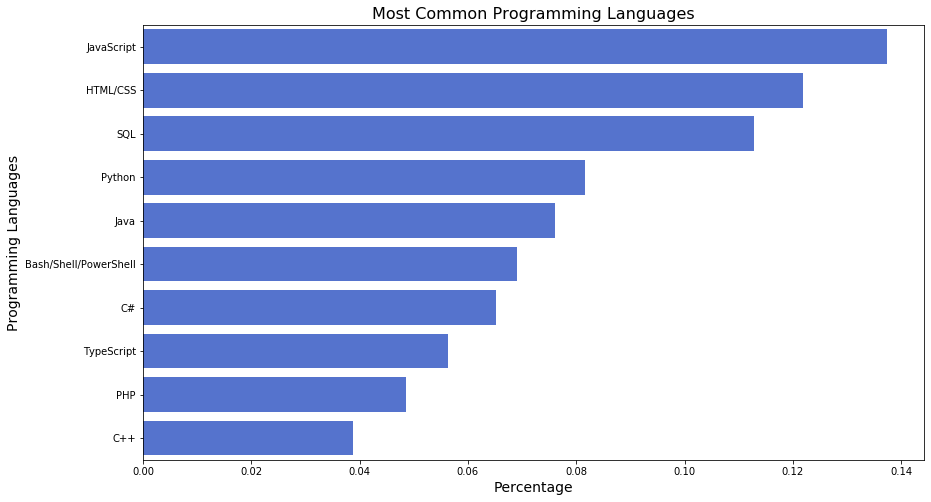

In [70]:
# Plot top 10 programming languages reported by developers
plt.figure(figsize=(14,8))
sns.barplot(x = 'Perc', 
            y = 'Programming Language',
            color="royalblue",
            data = worked_lang_chart_top.sort_values(by='Perc', ascending=False))

plt.xlabel("Percentage", fontsize = 14)
plt.ylabel("Programming Languages", fontsize = 14)
plt.title('Most Common Programming Languages', size = 16)
plt.show()

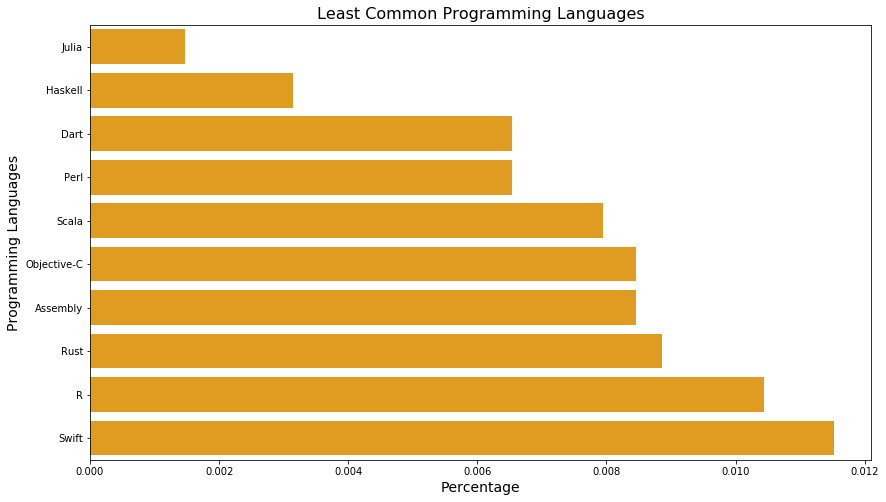

In [224]:
# Plot least popular programming languages reported by developers
plt.figure(figsize=(14,8))
sns.barplot(x = 'Perc', 
            y = 'Programming Language',
            color="orange",
            data = worked_lang_chart_bottom.sort_values(by='Perc', ascending=True))

plt.xlabel("Percentage", fontsize = 14)
plt.ylabel("Programming Languages", fontsize = 14)
plt.title('Least Common Programming Languages', size = 16)
plt.show()

The plots display the most and least popular programming languages reported by full-time employed developers. The top programming language is JavaScript followed by HTML/CSS and SQL. The least common language is Julia, followed by Haskell and Dart.

<a id='q2'></a>
## 2. What do developers think about the value of education?

**Gathering and assessing datasets**

In [72]:
# Group categories education importance, employment, and education level
q2 = df_2020[['NEWEdImpt', 'Employment', 'EdLevel']]
q2 = q2[q2.Employment == "Employed full-time"]
q2 = q2.dropna(axis=0)
q2['NEWEdImpt'] = q2['NEWEdImpt'].fillna('missing')
q2.head()

,NEWEdImpt,Employment,EdLevel
1,Fairly important,Employed full-time,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)"
4,Very important,Employed full-time,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)"
5,Fairly important,Employed full-time,"Secondary school (e.g. American high school, G..."
6,Very important,Employed full-time,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)"
7,Not at all important/not necessary,Employed full-time,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)"


In [73]:
q2.count()

NEWEdImpt     39472
Employment    39472
EdLevel       39472
dtype: int64

**Cleaning**

In [225]:
# Split column by ; to display education importance as a series
def split_edimpt(df2, column):
    ''' Split column by ;,
        returns a splited series.
    '''
    
    df2_copy = df2
    column_series = df2_copy[column].apply(lambda x: x.split(';'))
    
    return column_series

# Split df by column into a series 
split_ed_imp = split_edimpt(q2, 'NEWEdImpt')

# Display list
split_ed_imp

1                          [Fairly important]
4                            [Very important]
5                          [Fairly important]
6                            [Very important]
7        [Not at all important/not necessary]
9                          [Fairly important]
10                           [Very important]
11                       [Somewhat important]
12       [Not at all important/not necessary]
13                       [Somewhat important]
16                         [Fairly important]
17                           [Very important]
18                         [Fairly important]
19                           [Very important]
21                           [Very important]
22                         [Fairly important]
23                           [Very important]
24                     [Critically important]
25                       [Somewhat important]
26                       [Somewhat important]
29                       [Somewhat important]
31                       [Somewhat

In [229]:
# Flat nested list by education importance
def disarray_edimp(array_list):
    ''' Flat a nested list,
        returns a flat list.
    '''
    
    objects = []
    
    for row in array_list:
        for obj in row:
            objects.append(obj.strip())
    for elem in q2['NEWEdImpt']:
        objects.append(elem)
    return objects

# Flat nested list objects
list_ed_imp = disarray_edimp(split_ed_imp)

# Display list
list_ed_imp

['Fairly important',
 'Very important',
 'Fairly important',
 'Very important',
 'Not at all important/not necessary',
 'Fairly important',
 'Very important',
 'Somewhat important',
 'Not at all important/not necessary',
 'Somewhat important',
 'Fairly important',
 'Very important',
 'Fairly important',
 'Very important',
 'Very important',
 'Fairly important',
 'Very important',
 'Critically important',
 'Somewhat important',
 'Somewhat important',
 'Somewhat important',
 'Somewhat important',
 'Somewhat important',
 'Somewhat important',
 'Very important',
 'Fairly important',
 'Very important',
 'Not at all important/not necessary',
 'Very important',
 'Very important',
 'Very important',
 'Fairly important',
 'Not at all important/not necessary',
 'Not at all important/not necessary',
 'Somewhat important',
 'Somewhat important',
 'Not at all important/not necessary',
 'Very important',
 'Somewhat important',
 'Fairly important',
 'Fairly important',
 'Not at all important/not nece

In [230]:
# Make a dict that groups by count and returns a dict
def group_list_edimp(data_list):
    ''' Group by count to a list,
        returns a result dict only for JobSat.
    '''
    
    grouped_list = dict(Counter(data_list))
    grouped_dict = [{'NEWEdImpt':key, 'Count': value} for key, value in grouped_list.items()]
    
    return grouped_dict

    
# Group list and create a dict
dict_ed_imp = group_list_edimp(list_ed_imp)

# Display dict
dict_ed_imp

[{'NEWEdImpt': 'Fairly important', 'Count': 21066},
 {'NEWEdImpt': 'Very important', 'Count': 19814},
 {'NEWEdImpt': 'Not at all important/not necessary', 'Count': 11680},
 {'NEWEdImpt': 'Somewhat important', 'Count': 18502},
 {'NEWEdImpt': 'Critically important', 'Count': 7882}]

In [102]:
# Append the data to create df
ed_importance = create_dataframe(dict_ed_imp)
ed_importance

,NEWEdImpt,Count
0,Fairly important,10533
1,Very important,9907
2,Not at all important/not necessary,5840
3,Somewhat important,9251
4,Critically important,3941


**Analyzing and modeling**

In [231]:
# Convert to percentage
def percentage_edimp(df2):
    ''' Scale data,
        returns data scaled as a percentage.
    '''
    
    df2_copy = df2
    series = []
    
    for val in df2_copy['Count'].unique():
        df2_copy['Perc'] = df2_copy['Count']/df2_copy['Count'].sum()
    
    joined_series = pd.Series()
    for i_series in series:
        joined_series = joined_series.append(i_series)
        
    return joined_series


# Calculating the percentage
ed_importance['Percentage'] = percentage_edimp(ed_importance)
ed_importance

,NEWEdImpt,Count,Perc,Percentage
0,Fairly important,10533,0.266847,NaN
1,Very important,9907,0.250988,NaN
2,Not at all important/not necessary,5840,0.147953,NaN
3,Somewhat important,9251,0.234369,NaN
4,Critically important,3941,0.099843,NaN


**Visualizing findings**

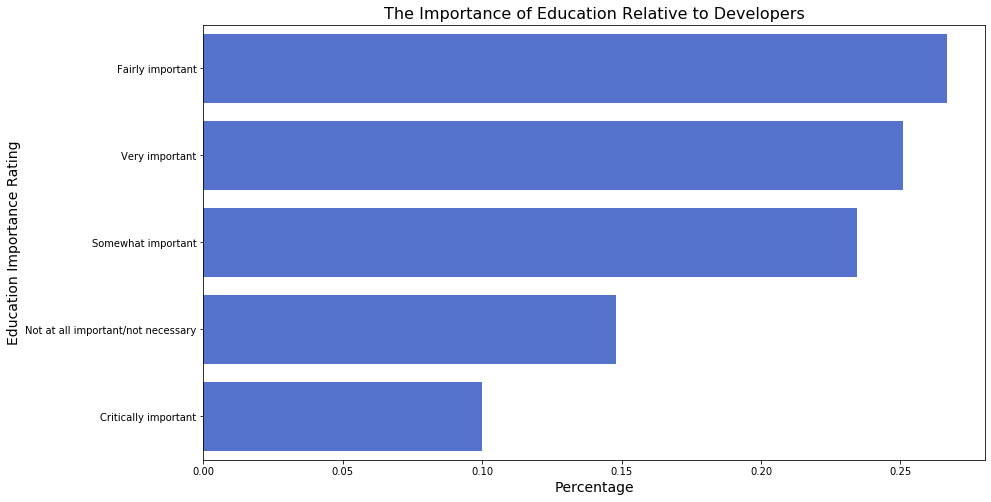

In [233]:
# Plot education importance ratings 
plt.figure(figsize=(14,8))
sns.barplot(x = 'Perc', 
            y = 'NEWEdImpt',
            color="royalblue",
            data = ed_importance.sort_values(by='Perc', ascending=False))

plt.xlabel("Percentage", fontsize = 14)
plt.ylabel("Education Importance Rating", fontsize = 14)
plt.title('The Importance of Education Relative to Developers', size = 16)
plt.show()

When asked about the importance of education in their roles, developers provided rankings seen in the above plot. Based on full-time, employed developers' responses, 'Fairly important' ranks highest and 'Critically important' ranks lowest. 

<a id='q3'></a>
## 3. What leads developers to job hunt?

**Gathering and columns of interest and cleaning**

In [121]:
# Grouping categories associated with job hunt for full-time employed developers
q3 = df_2020[['NEWJobHunt', 'Employment']]
q3 = q3[q3.Employment == "Employed full-time"]
q3 = q3.dropna(axis=0)
q3['NEWJobHunt'] = q3['NEWJobHunt'].fillna('missing')
q3.head()

,NEWJobHunt,Employment
6,Better compensation;Growth or leadership oppor...,Employed full-time
7,Curious about other opportunities;Better compe...,Employed full-time
9,Curious about other opportunities;Better compe...,Employed full-time
10,Curious about other opportunities;Better compe...,Employed full-time
11,Better compensation,Employed full-time


In [234]:
# Split column by ; to display job hunt factors as a series
def split_jobhunt(df3, column):
    ''' Split column by ;,
        returns a splited series.
    '''
    
    df3_copy = df3
    column_series = df3_copy[column].apply(lambda x: x.split(';'))
    
    return column_series

# Split df by column into a series 
split_job_hunt = split_jobhunt(q3, 'NEWJobHunt')

# Display list
split_job_hunt

6        [Better compensation, Growth or leadership opp...
7        [Curious about other opportunities, Better com...
9        [Curious about other opportunities, Better com...
10       [Curious about other opportunities, Better com...
11                                   [Better compensation]
12           [Having a bad day (or week or month) at work]
13       [Wanting to share accomplishments with a wider...
16       [Having a bad day (or week or month) at work, ...
17                                   [Looking to relocate]
18       [Having a bad day (or week or month) at work, ...
19       [Having a bad day (or week or month) at work, ...
21       [Better compensation, Better work/life balance...
22       [Curious about other opportunities, Better com...
23       [Having a bad day (or week or month) at work, ...
24       [Curious about other opportunities, Growth or ...
25       [Curious about other opportunities, Better com...
29       [Curious about other opportunities, Better com.

In [235]:
# Flat nested list
def disarray_jobhunt(array_list):
    ''' Flat a nested list,
        returns a flat list.
    '''
    
    objects = []
    
    for row in array_list:
        for obj in row:
            objects.append(obj.strip())
    for elem in df_2020['NEWJobHunt']:
        objects.append(elem)
    return objects

# Flat nested list objects
list_job_hunt = disarray_jobhunt(split_job_hunt)

# Display list
list_job_hunt

['Better compensation',
 'Growth or leadership opportunities',
 'Curious about other opportunities',
 'Better compensation',
 'Trouble with my direct manager',
 'Trouble with leadership at my company',
 'Better work/life balance',
 'Wanting to work with new technologies',
 'Growth or leadership opportunities',
 'Curious about other opportunities',
 'Better compensation',
 'Looking to relocate',
 'Curious about other opportunities',
 'Better compensation',
 'Trouble with leadership at my company',
 'Better work/life balance',
 'Wanting to work with new technologies',
 'Growth or leadership opportunities',
 'Better compensation',
 'Having a bad day (or week or month) at work',
 'Wanting to share accomplishments with a wider network',
 'Curious about other opportunities',
 'Better compensation',
 'Wanting to work with new technologies',
 'Growth or leadership opportunities',
 'Having a bad day (or week or month) at work',
 'Better compensation',
 'Trouble with leadership at my company',
 

In [236]:
# Create dict that groups by count
def group_list_jobhunt(data_list):
    ''' Group by count to a list,
        returns a result dict only for JobSat.
    '''
    
    grouped_list = dict(Counter(data_list))
    grouped_dict = [{'NEWJobHunt':key, 'Count': value} for key, value in grouped_list.items()]
    
    return grouped_dict

    
# Group list and count
dict_job_hunt = group_list_jobhunt(list_job_hunt)

# Display dict
dict_job_hunt

[{'NEWJobHunt': 'Better compensation', 'Count': 26020},
 {'NEWJobHunt': 'Growth or leadership opportunities', 'Count': 19391},
 {'NEWJobHunt': 'Curious about other opportunities', 'Count': 20818},
 {'NEWJobHunt': 'Trouble with my direct manager', 'Count': 6233},
 {'NEWJobHunt': 'Trouble with leadership at my company', 'Count': 10001},
 {'NEWJobHunt': 'Better work/life balance', 'Count': 17219},
 {'NEWJobHunt': 'Wanting to work with new technologies', 'Count': 21024},
 {'NEWJobHunt': 'Looking to relocate', 'Count': 9692},
 {'NEWJobHunt': 'Having a bad day (or week or month) at work', 'Count': 7692},
 {'NEWJobHunt': 'Wanting to share accomplishments with a wider network',
  'Count': 3390},
 {'NEWJobHunt': 'Trouble with my teammates', 'Count': 4267},
 {'NEWJobHunt': 'Just because', 'Count': 4518},
 {'NEWJobHunt': nan, 'Count': 22175},
 {'NEWJobHunt': 'Curious about other opportunities;Wanting to work with new technologies',
  'Count': 377},
 {'NEWJobHunt': 'Better compensation;Growth or l

**Analyzing and modeling**

In [126]:
# Append the data to create df
job_hunt = create_dataframe(dict_job_hunt)
job_hunt

,NEWJobHunt,Count
0,Better compensation,26020
1,Growth or leadership opportunities,19391
2,Curious about other opportunities,20818
3,Trouble with my direct manager,6233
4,Trouble with leadership at my company,10001
5,Better work/life balance,17219
6,Wanting to work with new technologies,21024
7,Looking to relocate,9692
8,Having a bad day (or week or month) at work,7692
9,Wanting to share accomplishments with a wider ...,3390


In [143]:
# Filter by top 10 reasons that prompt developers to job hunt
reasons_job_hunt = job_hunt.sort_values(by=['Count'], ascending=False).head(11)['NEWJobHunt'].unique()
reasons_job_hunt

array(['Better compensation', nan,
       'Wanting to work with new technologies',
       'Curious about other opportunities',
       'Growth or leadership opportunities', 'Better work/life balance',
       'Trouble with leadership at my company', 'Looking to relocate',
       'Having a bad day (or week or month) at work',
       'Trouble with my direct manager', 'Just because'], dtype=object)

In [147]:
# Make chart 
reasons_job_hunt_chart = job_hunt[job_hunt['NEWJobHunt'].isin(reasons_job_hunt)]
reasons_job_hunt_chart

,NEWJobHunt,Count
0,Better compensation,26020
1,Growth or leadership opportunities,19391
2,Curious about other opportunities,20818
3,Trouble with my direct manager,6233
4,Trouble with leadership at my company,10001
5,Better work/life balance,17219
6,Wanting to work with new technologies,21024
7,Looking to relocate,9692
8,Having a bad day (or week or month) at work,7692
11,Just because,4518


In [150]:
# 10 most popular job hunt reasons
job_hunt_reasons = reasons_job_hunt_chart.dropna()
job_hunt_reasons

,NEWJobHunt,Count
0,Better compensation,26020
1,Growth or leadership opportunities,19391
2,Curious about other opportunities,20818
3,Trouble with my direct manager,6233
4,Trouble with leadership at my company,10001
5,Better work/life balance,17219
6,Wanting to work with new technologies,21024
7,Looking to relocate,9692
8,Having a bad day (or week or month) at work,7692
11,Just because,4518


In [237]:
# Convert to percentage
def percentage_jobhunt(df3):
    ''' Scale data,
        returns data scaled as a percentage.
    '''
    
    df3_copy = df3
    series = []
    
    for val in df3_copy['Count'].unique():
        df3_copy['Perc'] = df3_copy['Count']/df3_copy['Count'].sum()
    
    joined_series = pd.Series()
    for i_series in series:
        joined_series = joined_series.append(i_series)
        
    return joined_series


# Calculating the percentage
job_hunt_reasons['Percentage'] = percentage_jobhunt(job_hunt_reasons)
job_hunt_reasons

,NEWJobHunt,Count,Perc,Percentage
0,Better compensation,26020,0.182458,NaN
1,Growth or leadership opportunities,19391,0.135974,NaN
2,Curious about other opportunities,20818,0.145981,NaN
3,Trouble with my direct manager,6233,0.043707,NaN
4,Trouble with leadership at my company,10001,0.070129,NaN
5,Better work/life balance,17219,0.120744,NaN
6,Wanting to work with new technologies,21024,0.147425,NaN
7,Looking to relocate,9692,0.067963,NaN
8,Having a bad day (or week or month) at work,7692,0.053938,NaN
11,Just because,4518,0.031681,NaN


**Visualize findings**

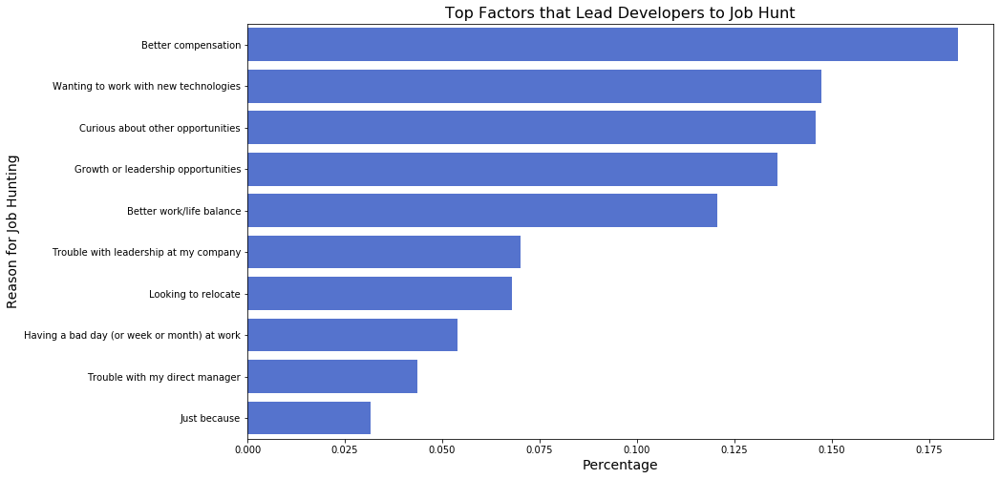

In [238]:
# Plot top factors that lead to job hunt
plt.figure(figsize=(14,8))
sns.barplot(x = 'Perc', 
            y = 'NEWJobHunt',
            color="royalblue",
            data = job_hunt_reasons.sort_values(by='Perc', ascending=False))

plt.xlabel("Percentage", fontsize = 14)
plt.ylabel("Reason for Job Hunting", fontsize = 14)
plt.title('Top Factors that Lead Developers to Job Hunt', size = 16)
plt.show()

This plot displays the factors that lead developers to search for another job. The top three reported reasons are for 'better compensation', 'wanting to work with new technologies', and 'curious about other opportunities'. The lowest ranked reasons were 'having a bad day (or week or month) at work', 'trouble with my direct manager'. and 'just because'.

<a id='q4'></a>
## 4. What resources do developers use to learn more about a company?

**Gathering and cleaning categories of interest**

In [152]:
# Grouping categories associated with company research 
q4 = df_2020[['NEWJobHuntResearch', 'Employment']]
q4 = q4[q4.Employment == "Employed full-time"]
q4 = q4.dropna(axis=0)
q4['NEWJobHuntResearch'] = q4['NEWJobHuntResearch'].fillna('missing')
q4.head()

,NEWJobHuntResearch,Employment
6,"Read company media, such as employee blogs or ...",Employed full-time
7,"Read company media, such as employee blogs or ...",Employed full-time
9,Company reviews from third party sites (e.g. G...,Employed full-time
10,"Read company media, such as employee blogs or ...",Employed full-time
11,Personal network - friends or family;Directly ...,Employed full-time


In [239]:
# Split column by ; to display research as a series
def split_column_research(df4, column):
    ''' Split column by ;,
        returns a splited series.
    '''
    
    df4_copy = df4
    column_series = df4_copy[column].apply(lambda x: x.split(';'))
    
    return column_series

# Split df by column into a series 
split_job_research = split_column_research(q4,'NEWJobHuntResearch')

# Display list
split_job_research

6        [Read company media, such as employee blogs or...
7        [Read company media, such as employee blogs or...
9        [Company reviews from third party sites (e.g. ...
10       [Read company media, such as employee blogs or...
11       [Personal network - friends or family, Directl...
12       [Read company media, such as employee blogs or...
13       [Read company media, such as employee blogs or...
16       [Company reviews from third party sites (e.g. ...
18       [Company reviews from third party sites (e.g. ...
19                  [Personal network - friends or family]
21       [Company reviews from third party sites (e.g. ...
22       [Company reviews from third party sites (e.g. ...
25       [Read company media, such as employee blogs or...
29       [Read company media, such as employee blogs or...
31       [Personal network - friends or family, Read ot...
32       [Company reviews from third party sites (e.g. ...
36       [Directly asking current or past employees at .

In [240]:
# Flat nested list by research resources
def disarray_research(array_list):
    ''' Flat a nested list,
        returns a flat list.
    '''
    
    objects = []
    
    for row in array_list:
        for obj in row:
            objects.append(obj.strip())
    for elem in df_2020['NEWJobHuntResearch']:
        objects.append(elem)
    return objects

# Flatting nested list objects.
list_job_research = disarray_research(split_job_research)

# Display list
list_job_research

['Read company media, such as employee blogs or company culture videos',
 'Company reviews from third party sites (e.g. Glassdoor, Blind)',
 'Publicly available financial information (e.g. Crunchbase)',
 'Personal network - friends or family',
 'Read company media, such as employee blogs or company culture videos',
 'Company reviews from third party sites (e.g. Glassdoor, Blind)',
 'Personal network - friends or family',
 'Read other media like news articles, founder profiles, etc. about the company',
 'Company reviews from third party sites (e.g. Glassdoor, Blind)',
 'Publicly available financial information (e.g. Crunchbase)',
 'Personal network - friends or family',
 'Read other media like news articles, founder profiles, etc. about the company',
 'Read company media, such as employee blogs or company culture videos',
 'Company reviews from third party sites (e.g. Glassdoor, Blind)',
 'Publicly available financial information (e.g. Crunchbase)',
 'Personal network - friends or famil

In [241]:
# Create dict to group by count 
def group_list_research(data_list):
    ''' Group by count to a list,
        returns a result dict only for JobSat.
    '''
    
    grouped_list = dict(Counter(data_list))
    grouped_dict = [{'NEWJobHuntResearch':key, 'Count': value} for key, value in grouped_list.items()]
    
    return grouped_dict

    
# Grouping list and dict
dict_job_research = group_list_research(list_job_research)

# Display dict
dict_job_research

[{'NEWJobHuntResearch': 'Read company media, such as employee blogs or company culture videos',
  'Count': 23508},
 {'NEWJobHuntResearch': 'Company reviews from third party sites (e.g. Glassdoor, Blind)',
  'Count': 25718},
 {'NEWJobHuntResearch': 'Publicly available financial information (e.g. Crunchbase)',
  'Count': 9145},
 {'NEWJobHuntResearch': 'Personal network - friends or family',
  'Count': 23016},
 {'NEWJobHuntResearch': 'Read other media like news articles, founder profiles, etc. about the company',
  'Count': 17137},
 {'NEWJobHuntResearch': 'Directly asking current or past employees at the company',
  'Count': 12687},
 {'NEWJobHuntResearch': nan, 'Count': 23439},
 {'NEWJobHuntResearch': 'Read company media, such as employee blogs or company culture videos;Company reviews from third party sites (e.g. Glassdoor, Blind);Publicly available financial information (e.g. Crunchbase);Personal network - friends or family',
  'Count': 595},
 {'NEWJobHuntResearch': 'Read company media,

**Analyzing and Modeling**

In [164]:
# Append the data to create df
job_research = create_dataframe(dict_job_research)
job_research

,NEWJobHuntResearch,Count
0,"Read company media, such as employee blogs or ...",23508
1,Company reviews from third party sites (e.g. G...,25718
2,Publicly available financial information (e.g....,9145
3,Personal network - friends or family,23016
4,"Read other media like news articles, founder p...",17137
5,Directly asking current or past employees at t...,12687
6,NaN,23439
7,"Read company media, such as employee blogs or ...",595
8,"Read company media, such as employee blogs or ...",1955
9,Company reviews from third party sites (e.g. G...,315


In [181]:
# Filter by top 10 reasons that prompt developers to job hunt
top_job_research = job_research.sort_values(by=['Count'], ascending=False).head(7)['NEWJobHuntResearch'].unique()
top_job_research

array(['Company reviews from third party sites (e.g. Glassdoor, Blind)',
       'Read company media, such as employee blogs or company culture videos',
       nan, 'Personal network - friends or family',
       'Read other media like news articles, founder profiles, etc. about the company',
       'Directly asking current or past employees at the company',
       'Publicly available financial information (e.g. Crunchbase)'],
      dtype=object)

In [182]:
job_research_chart = job_research[job_research['NEWJobHuntResearch'].isin(top_job_research)]
job_research_chart

,NEWJobHuntResearch,Count
0,"Read company media, such as employee blogs or ...",23508
1,Company reviews from third party sites (e.g. G...,25718
2,Publicly available financial information (e.g....,9145
3,Personal network - friends or family,23016
4,"Read other media like news articles, founder p...",17137
5,Directly asking current or past employees at t...,12687
6,NaN,23439


In [183]:
# Drop NaN
job_hunt_research = job_research_chart.dropna()
job_hunt_research

,NEWJobHuntResearch,Count
0,"Read company media, such as employee blogs or ...",23508
1,Company reviews from third party sites (e.g. G...,25718
2,Publicly available financial information (e.g....,9145
3,Personal network - friends or family,23016
4,"Read other media like news articles, founder p...",17137
5,Directly asking current or past employees at t...,12687


In [242]:
# Convert to percentage
def percentage_research(df4):
    ''' Scale data,
        returns data scaled as a percentage.
    '''
    
    df4_copy = df4
    series = []
    
    for val in df4_copy['Count'].unique():
        df4_copy['Perc'] = df4_copy['Count']/df4_copy['Count'].sum()
    
    joined_series = pd.Series()
    for i_series in series:
        joined_series = joined_series.append(i_series)
        
    return joined_series


# Calculate the percentage
job_hunt_research['Percentage'] = percentage_research(job_hunt_research)
job_hunt_research

,NEWJobHuntResearch,Count,Perc,Percentage
0,"Read company media, such as employee blogs or ...",23508,0.211382,NaN
1,Company reviews from third party sites (e.g. G...,25718,0.231254,NaN
2,Publicly available financial information (e.g....,9145,0.082231,NaN
3,Personal network - friends or family,23016,0.206958,NaN
4,"Read other media like news articles, founder p...",17137,0.154094,NaN
5,Directly asking current or past employees at t...,12687,0.114080,NaN


**Visualize findings**

Text(0.5, 1.0, 'Most Popular Sources for Company Research')

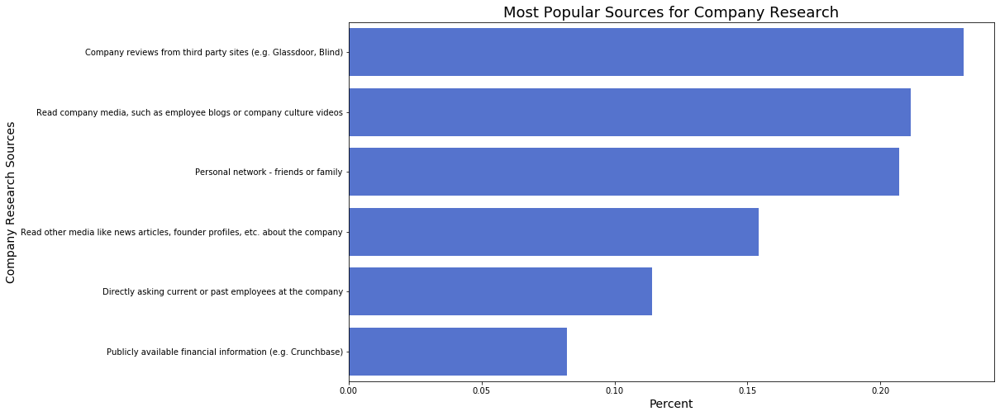

In [246]:
# Plot
plt.figure(figsize=(14,8))
sns.barplot(x = 'Perc', 
            y = 'NEWJobHuntResearch',
            color="royalblue",
            data = job_hunt_research.sort_values(by='Perc', ascending=False))

plt.xlabel("Percent", fontsize = 14)
plt.ylabel("Company Research Sources", fontsize = 14)
plt.title("Most Popular Sources for Company Research", fontsize=18)

This plot displays the resources developers use when researching companies while job hunting. The analysis indicates that most developers turn to 'Company reviews from third party sites' when researching companies. The second most common source for research is reading company media and third involves talking to personal networks. 

<a id='conclusions'></a>
# Conclusions

The 2020 Stack Overflow Developer Survey revealed the following insights for full-time Employed developers:
* The 10 most common programming languages in decreasing popularity are: JavaScript, HTML/CSS, SQL, Python, Java, Bash/Shell/PowerShell, C#, TypeScript, PHP, and C++. The least common languages in increasing order include: Julia, Haskell, Dart, Perl, Scala, Objective C, Assembly, Rust, R, and Swift.
* When asked about the importance of education in their roles, developers provided rankings. The most common response was 'Fairly important' and least frequent response was 'Critically important'.
* The top three reported reasons that developers search for another job is to find 'better compensation', 'wanting to work with new technologies', and 'curious about other opportunities'. The least common reasons developers job hunt were reported as 'having a bad day (or week or month) at work', 'trouble with my direct manager', and 'just because'.
* When job searching, developers turn to 'Company reviews from third party sites' when researching companies. This is followed by reading company media and discussing companies with personal networks. 

<a id='sources'></a>
# Source Index
* https://insights.stackoverflow.com/survey/2020
* https://pandas.pydata.org/pandas-docs/stable/user_guide/merging.html
* https://seaborn.pydata.org/generated/seaborn.barplot.html
* https://www.udacity.com/course/data-scientist-nanodegree--nd025